# PENGUMPULAN DATA

Menggunakan dari UCI heart Diseas

# MENELAAH DATA


In [1]:
# Mengimport library-library yang dibutuhkan

import pandas as pd
import re
import numpy as np
import itertools

In [2]:
dir = 'hungarian.data'  # Menginisiasi hungarian.data kedalam variabel dir

In [3]:
with open(dir, encoding='Latin1') as file:  # membuka file yang terdapat pada variabel dir,
  lines = [line.strip() for line in file] # menyimpan setiap baris yang ada didalam data kedalam variabel lines

lines[0:10] # menampilkan data

['1254 0 40 1 1 0 0',
 '-9 2 140 0 289 -9 -9 -9',
 '0 -9 -9 0 12 16 84 0',
 '0 0 0 0 150 18 -9 7',
 '172 86 200 110 140 86 0 0',
 '0 -9 26 20 -9 -9 -9 -9',
 '-9 -9 -9 -9 -9 -9 -9 12',
 '20 84 0 -9 -9 -9 -9 -9',
 '-9 -9 -9 -9 -9 1 1 1',
 '1 1 -9. -9. name']

In [4]:
data = itertools.takewhile(
  lambda x: len(x) == 76,
  (' '.join(lines[i:(i + 10)]).split() for i in range(0, len(lines), 10))
)  # membaca data yang bersifat perulangan, menggabungkan data setiap 10 baris menjadi satu string yang dipisahkan dengan spasi

df = pd.DataFrame.from_records(data)

df.head()

,0,1,2,3,4,5,6,7,8,9,...,66,67,68,69,70,71,72,73,74,75
0,1254,0,40,1,1,0,0,-9,2,140,...,-9,-9,1,1,1,1,1,-9.,-9.,name
1,1255,0,49,0,1,0,0,-9,3,160,...,-9,-9,1,1,1,1,1,-9.,-9.,name
2,1256,0,37,1,1,0,0,-9,2,130,...,-9,-9,1,1,1,1,1,-9.,-9.,name
3,1257,0,48,0,1,1,1,-9,4,138,...,2,-9,1,1,1,1,1,-9.,-9.,name
4,1258,0,54,1,1,0,1,-9,3,150,...,1,-9,1,1,1,1,1,-9.,-9.,name


In [5]:
df.info() # mengecek tipe data setiap kolom

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 76 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       294 non-null    object
 1   1       294 non-null    object
 2   2       294 non-null    object
 3   3       294 non-null    object
 4   4       294 non-null    object
 5   5       294 non-null    object
 6   6       294 non-null    object
 7   7       294 non-null    object
 8   8       294 non-null    object
 9   9       294 non-null    object
 10  10      294 non-null    object
 11  11      294 non-null    object
 12  12      294 non-null    object
 13  13      294 non-null    object
 14  14      294 non-null    object
 15  15      294 non-null    object
 16  16      294 non-null    object
 17  17      294 non-null    object
 18  18      294 non-null    object
 19  19      294 non-null    object
 20  20      294 non-null    object
 21  21      294 non-null    object
 22  22      294 non-null    ob

In [6]:
df = df.iloc[:,:-1] # menghapus kolom terakhir
df = df.drop(df.columns[0], axis=1) # menghapus kolom pertama

In [7]:
df = df.astype(float) # mengubah tipedata menjadi float

In [8]:
df.info() # mengecel tipe data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       294 non-null    float64
 1   2       294 non-null    float64
 2   3       294 non-null    float64
 3   4       294 non-null    float64
 4   5       294 non-null    float64
 5   6       294 non-null    float64
 6   7       294 non-null    float64
 7   8       294 non-null    float64
 8   9       294 non-null    float64
 9   10      294 non-null    float64
 10  11      294 non-null    float64
 11  12      294 non-null    float64
 12  13      294 non-null    float64
 13  14      294 non-null    float64
 14  15      294 non-null    float64
 15  16      294 non-null    float64
 16  17      294 non-null    float64
 17  18      294 non-null    float64
 18  19      294 non-null    float64
 19  20      294 non-null    float64
 20  21      294 non-null    float64
 21  22      294 non-null    float64
 22  23

# Validasi Data

In [9]:
df.replace(-9.0, np.nan, inplace=True) # mengubah nilai -9.0 menjadi nan

In [10]:
df.isnull().sum() # menghitung jumlah nan

1       0
2       0
3       0
4       0
5       0
     ... 
70      0
71      0
72      0
73    266
74    294
Length: 74, dtype: int64

In [11]:
df.head()

,1,2,3,4,5,6,7,8,9,10,...,65,66,67,68,69,70,71,72,73,74
0,0.0,40.0,1.0,1.0,0.0,0.0,NaN,2.0,140.0,0.0,...,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN
1,0.0,49.0,0.0,1.0,0.0,0.0,NaN,3.0,160.0,1.0,...,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN
2,0.0,37.0,1.0,1.0,0.0,0.0,NaN,2.0,130.0,0.0,...,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN
3,0.0,48.0,0.0,1.0,1.0,1.0,NaN,4.0,138.0,0.0,...,NaN,2.0,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN
4,0.0,54.0,1.0,1.0,0.0,1.0,NaN,3.0,150.0,0.0,...,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       294 non-null    float64
 1   2       294 non-null    float64
 2   3       294 non-null    float64
 3   4       294 non-null    float64
 4   5       294 non-null    float64
 5   6       294 non-null    float64
 6   7       0 non-null      float64
 7   8       294 non-null    float64
 8   9       293 non-null    float64
 9   10      293 non-null    float64
 10  11      271 non-null    float64
 11  12      12 non-null     float64
 12  13      1 non-null      float64
 13  14      0 non-null      float64
 14  15      286 non-null    float64
 15  16      21 non-null     float64
 16  17      1 non-null      float64
 17  18      293 non-null    float64
 18  19      294 non-null    float64
 19  20      294 non-null    float64
 20  21      294 non-null    float64
 21  22      293 non-null    float64
 22  23

# Menentukan Object Data

In [13]:
df_selected = df.iloc[:, [1, 2, 7,8,10,14,17,30,36,38,39,42,49,56]] # memilih kolom yang akan digunakan berdasarkan index dari kolom

In [14]:
df_selected.head()

,2,3,8,9,11,15,18,31,37,39,40,43,50,57
0,40.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,NaN,NaN,NaN,0.0
1,49.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,2.0,NaN,NaN,1.0
2,37.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,NaN,NaN,NaN,0.0
3,48.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,2.0,NaN,NaN,3.0
4,54.0,1.0,3.0,150.0,NaN,0.0,0.0,122.0,0.0,0.0,NaN,NaN,NaN,0.0


In [15]:
df_selected.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2       294 non-null    float64
 1   3       294 non-null    float64
 2   8       294 non-null    float64
 3   9       293 non-null    float64
 4   11      271 non-null    float64
 5   15      286 non-null    float64
 6   18      293 non-null    float64
 7   31      293 non-null    float64
 8   37      293 non-null    float64
 9   39      294 non-null    float64
 10  40      104 non-null    float64
 11  43      4 non-null      float64
 12  50      28 non-null     float64
 13  57      294 non-null    float64
dtypes: float64(14)
memory usage: 32.3 KB


In [16]:
column_mapping = {
    2: 'age',
    3: 'sex',
    8: 'cp',
    9: 'trestbps',
    11: 'chol',
    15: 'fbs',
    18: 'restecg',
    31: 'thalach',
    37: 'exang',
    39: 'oldpeak',
    40: 'slope',
    43: 'ca',
    50: 'thal',
    57: 'target'
}

df_selected.rename(columns=column_mapping, inplace=True)  # merubah nama dari kolom berdasarkan dictionary column_maping
df_selected.head()

C:\Users\Yudha\AppData\Local\Temp\ipykernel_7012\3395039026.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected.rename(columns=column_mapping, inplace=True)  # merubah nama dari kolom berdasarkan dictionary column_maping


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,40.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,NaN,NaN,NaN,0.0
1,49.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,2.0,NaN,NaN,1.0
2,37.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,NaN,NaN,NaN,0.0
3,48.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,2.0,NaN,NaN,3.0
4,54.0,1.0,3.0,150.0,NaN,0.0,0.0,122.0,0.0,0.0,NaN,NaN,NaN,0.0


In [17]:
df_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       294 non-null    float64
 1   sex       294 non-null    float64
 2   cp        294 non-null    float64
 3   trestbps  293 non-null    float64
 4   chol      271 non-null    float64
 5   fbs       286 non-null    float64
 6   restecg   293 non-null    float64
 7   thalach   293 non-null    float64
 8   exang     293 non-null    float64
 9   oldpeak   294 non-null    float64
 10  slope     104 non-null    float64
 11  ca        4 non-null      float64
 12  thal      28 non-null     float64
 13  target    294 non-null    float64
dtypes: float64(14)
memory usage: 32.3 KB


In [18]:
df_selected.value_counts()

age   sex  cp   trestbps  chol   fbs  restecg  thalach  exang  oldpeak  slope  ca   thal  target
47.0  1.0  4.0  150.0     226.0  0.0  0.0      98.0     1.0    1.5      2.0    0.0  7.0   1.0       1
Name: count, dtype: int64

# MEMBERSIHKAN DATA

In [19]:
df_selected.isnull().sum() # mengecek nilai null

age           0
sex           0
cp            0
trestbps      1
chol         23
fbs           8
restecg       1
thalach       1
exang         1
oldpeak       0
slope       190
ca          290
thal        266
target        0
dtype: int64

In [20]:
columns_to_drop = ['ca', 'slope','thal']
df_selected = df_selected.drop(columns_to_drop, axis=1) # menghapus 3 kolom diatas dikarenakan nilai null melebihi 50%

In [21]:
df_selected.isnull().sum()

age          0
sex          0
cp           0
trestbps     1
chol        23
fbs          8
restecg      1
thalach      1
exang        1
oldpeak      0
target       0
dtype: int64

In [22]:
# Menghapus setiap kolom dengan nilai nan

meanTBPS = df_selected['trestbps'].dropna()
meanChol = df_selected['chol'].dropna()
meanfbs = df_selected['fbs'].dropna()
meanRestCG = df_selected['restecg'].dropna()
meanthalach = df_selected['thalach'].dropna()
meanexang = df_selected['exang'].dropna()

In [23]:
# mengubah tipe datanya menjadi float

meanTBPS = meanTBPS.astype(float)
meanChol = meanChol.astype(float)
meanfbs = meanfbs.astype(float)
meanthalach = meanthalach.astype(float)
meanexang = meanexang.astype(float)
meanRestCG = meanRestCG.astype(float)

In [24]:
# Menghitung rata rata setiap kolom

meanTBPS = round(meanTBPS.mean())
meanChol = round(meanChol.mean())
meanfbs = round(meanfbs.mean())
meanthalach = round(meanthalach.mean())
meanexang = round(meanexang.mean())
meanRestCG = round(meanRestCG.mean())

In [25]:
fill_values = {'trestbps': meanTBPS, 'chol': meanChol, 'fbs': meanfbs,
              'thalach':meanthalach,'exang':meanexang,'restecg':meanRestCG}
dfClean = df_selected.fillna(value=fill_values)  # mengisi kolom yang kosong dengan rata rata setiap kolomnya

In [26]:
dfClean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       294 non-null    float64
 1   sex       294 non-null    float64
 2   cp        294 non-null    float64
 3   trestbps  294 non-null    float64
 4   chol      294 non-null    float64
 5   fbs       294 non-null    float64
 6   restecg   294 non-null    float64
 7   thalach   294 non-null    float64
 8   exang     294 non-null    float64
 9   oldpeak   294 non-null    float64
 10  target    294 non-null    float64
dtypes: float64(11)
memory usage: 25.4 KB


In [27]:
dfClean.isnull().sum() # mengecek kembali nilai yang kosong


age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
target      0
dtype: int64

In [28]:
duplicate_rows = dfClean.duplicated()
dfClean[duplicate_rows] # mengecek nilai duplikat

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
163,49.0,0.0,2.0,110.0,251.0,0.0,0.0,160.0,0.0,0.0,0.0


In [29]:
print("All Duplicate Rows:")
dfClean[dfClean.duplicated(keep=False)] # Menampilkan 2 data duplikat

All Duplicate Rows:


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
90,49.0,0.0,2.0,110.0,251.0,0.0,0.0,160.0,0.0,0.0,0.0
163,49.0,0.0,2.0,110.0,251.0,0.0,0.0,160.0,0.0,0.0,0.0


In [30]:
dfClean = dfClean.drop_duplicates() # menghapus data duplikat
print("All Duplicate Rows:")
dfClean[dfClean.duplicated(keep=False)] # menampilkan data duplikat

All Duplicate Rows:


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target


In [31]:
dfClean.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
0,40.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,0.0
1,49.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,1.0
2,37.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,0.0
3,48.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,3.0
4,54.0,1.0,3.0,150.0,251.0,0.0,0.0,122.0,0.0,0.0,0.0


In [32]:
dfClean['target'].value_counts() # mengecek jumlah sampel setiap kelasnya

target
0.0    187
1.0     37
3.0     28
2.0     26
4.0     15
Name: count, dtype: int64

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

In [34]:
dfClean.corr() # mengecek korelasi antar kolom

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
age,1.000000,0.014516,0.146616,0.246571,0.087101,0.181130,0.050672,-0.460514,0.239223,0.178172,0.210429
sex,0.014516,1.000000,0.245769,0.082064,0.027695,0.044372,-0.108656,-0.106959,0.154925,0.115959,0.220732
cp,0.146616,0.245769,1.000000,0.081293,0.134697,0.031930,-0.016372,-0.367819,0.494674,0.351735,0.427536
trestbps,0.246571,0.082064,0.081293,1.000000,0.080818,0.096222,0.011256,-0.181824,0.211507,0.204000,0.214898
chol,0.087101,0.027695,0.134697,0.080818,1.000000,0.107686,0.048081,-0.122038,0.161055,0.106743,0.256027
fbs,0.181130,0.044372,0.031930,0.096222,0.107686,1.000000,0.047988,-0.069722,0.115503,0.063179,0.154319
restecg,0.050672,-0.108656,-0.016372,0.011256,0.048081,0.047988,1.000000,0.006084,0.041290,0.042193,0.042643
thalach,-0.460514,-0.106959,-0.367819,-0.181824,-0.122038,-0.069722,0.006084,1.000000,-0.400508,-0.300458,-0.367525
exang,0.239223,0.154925,0.494674,0.211507,0.161055,0.115503,0.041290,-0.400508,1.000000,0.624965,0.571710
oldpeak,0.178172,0.115959,0.351735,0.204000,0.106743,0.063179,0.042193,-0.300458,0.624965,1.000000,0.580732


<Axes: >

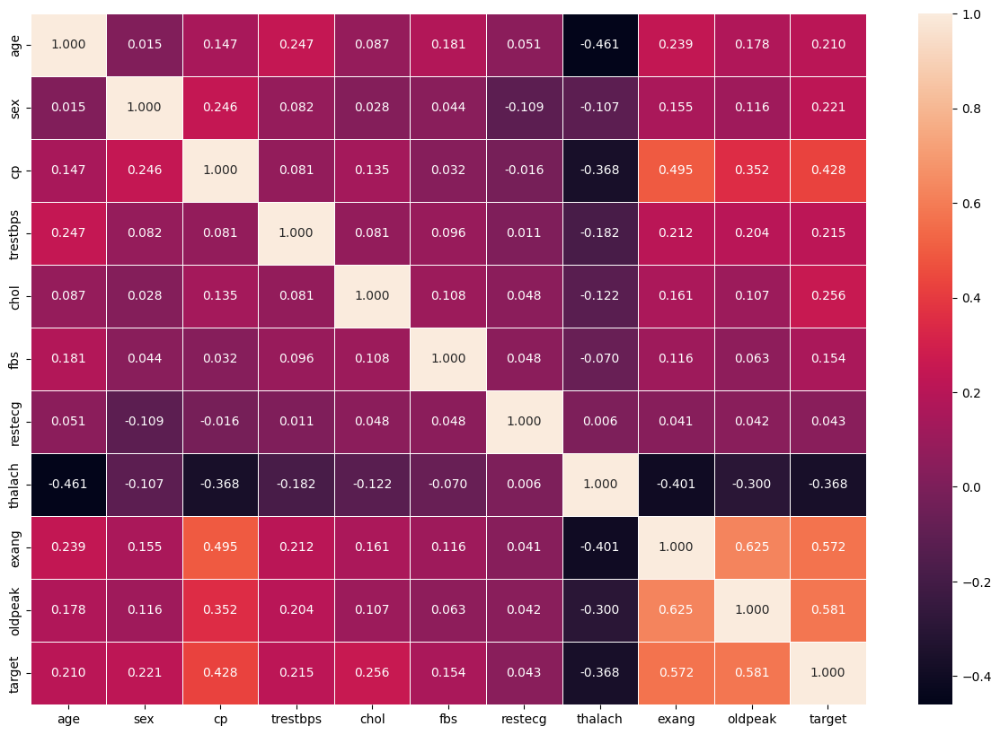

In [35]:
# menampilkan data korelasi melalui heatmap

cor_mat=dfClean.corr()
fig,ax=plt.subplots(figsize=(15,10))
sns.heatmap(cor_mat,annot=True,linewidths=0.5,fmt=".3f")

# KONSTRUKSI DATA

In [36]:
dfClean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 293 entries, 0 to 293
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       293 non-null    float64
 1   sex       293 non-null    float64
 2   cp        293 non-null    float64
 3   trestbps  293 non-null    float64
 4   chol      293 non-null    float64
 5   fbs       293 non-null    float64
 6   restecg   293 non-null    float64
 7   thalach   293 non-null    float64
 8   exang     293 non-null    float64
 9   oldpeak   293 non-null    float64
 10  target    293 non-null    float64
dtypes: float64(11)
memory usage: 27.5 KB


In [37]:
X = dfClean.drop('target', axis=1).values # mengambil nilai dari semua kolom kecuali kolom target
y = dfClean['target'].values # mengambil nilai dari kolom target

In [38]:
dfClean['target'].value_counts() # mengecek jumlah sample setiap kelas

target
0.0    187
1.0     37
3.0     28
2.0     26
4.0     15
Name: count, dtype: int64

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0.0'),
  Text(1, 0, '1.0'),
  Text(2, 0, '3.0'),
  Text(3, 0, '2.0'),
  Text(4, 0, '4.0')])

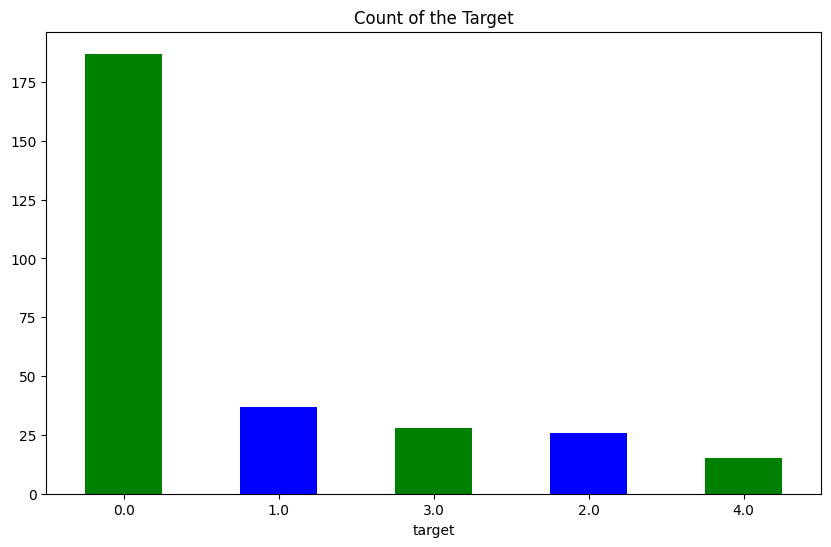

In [39]:
dfClean['target'].value_counts().plot(kind='bar', figsize=(10,6), color=['green','blue']) # mengecek jumlah sample setiap kelas kemudian menampilkannya kedalam diagram batang
plt.title('Count of the Target')
plt.xticks(rotation=0)

In [39]:
from imblearn.over_sampling import SMOTE # import library untuk melakukan smote

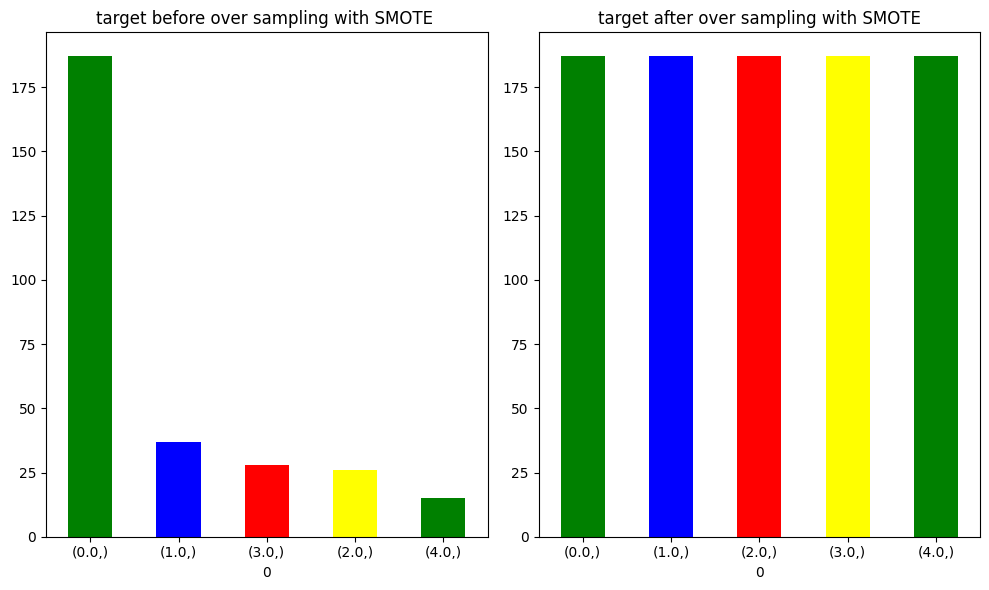

In [40]:
smote = SMOTE(random_state = 42) # inisiasi fungsi SMOTE kedalam variabel smote
X_smote_resampled, y_smote_resampled = smote.fit_resample(X,y) # melakukan oversampling 


plt.figure(figsize=(12, 4))

new_df1 = pd.DataFrame(data=y) # membuat dataframe dari kolom target(y) untuk melakukan visualisasi data sebelum di oversampling

plt.subplot(1, 2, 1) 
new_df1.value_counts().plot(kind='bar',figsize=(10,6),color=['green','blue','red','yellow'])
plt.title("target before over sampling with SMOTE ")
plt.xticks(rotation=0)

plt.subplot(1, 2, 2)
new_df2 = pd.DataFrame(data=y_smote_resampled) # membuat dataframe dari kolom y_smote_resample untuk melakukan visualisasi data setelah dilakukan oversampling

new_df2.value_counts().plot(kind='bar',figsize=(10,6),color=['green','blue','red','yellow'])
plt.title("target after over sampling with SMOTE")
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

In [41]:
dfClean.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
count,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000
mean,47.822526,0.726962,2.986348,132.662116,250.860068,0.068259,0.218430,139.058020,0.303754,0.588055,0.795222
std,7.824875,0.446282,0.965049,17.576793,65.059069,0.252622,0.460868,23.558003,0.460665,0.909554,1.238251
min,28.000000,0.000000,1.000000,92.000000,85.000000,0.000000,0.000000,82.000000,0.000000,0.000000,0.000000
25%,42.000000,0.000000,2.000000,120.000000,211.000000,0.000000,0.000000,122.000000,0.000000,0.000000,0.000000
50%,49.000000,1.000000,3.000000,130.000000,248.000000,0.000000,0.000000,140.000000,0.000000,0.000000,0.000000
75%,54.000000,1.000000,4.000000,140.000000,277.000000,0.000000,0.000000,155.000000,1.000000,1.000000,1.000000
max,66.000000,1.000000,4.000000,200.000000,603.000000,1.000000,2.000000,190.000000,1.000000,5.000000,4.000000


In [43]:
X_smote_resampled, y_smote_resampled

aftersmote = pd.DataFrame(X_smote_resampled)
aftersmote['target'] = y_smote_resampled

In [47]:
aftersmote.head()

,0,1,2,3,4,5,6,7,8,9,target
0,40.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,0.0
1,49.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,1.0
2,37.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,0.0
3,48.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,3.0
4,54.0,1.0,3.0,150.0,251.0,0.0,0.0,122.0,0.0,0.0,0.0


In [48]:
column_mapping = {
    0: 'age',
    1: 'sex',
    2: 'cp',
    3: 'trestbps',
    4: 'chol',
    5: 'fbs',
    6: 'restecg',
    7: 'thalach',
    8: 'exang',
    9: 'oldpeak',
}

aftersmote.rename(columns=column_mapping, inplace=True)  # merubah nama dari kolom berdasarkan dictionary column_maping
aftersmote.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,target
0,40.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,0.0
1,49.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,1.0
2,37.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,0.0
3,48.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,3.0
4,54.0,1.0,3.0,150.0,251.0,0.0,0.0,122.0,0.0,0.0,0.0


In [49]:
aftersmote.to_csv("final_data.csv")

In [50]:
# melakukan normalisasi menggunakan standard scaler agar data memiliki rentang yang sama
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_smote_resampled_normal = scaler.fit_transform(X_smote_resampled)

len(X_smote_resampled_normal)

935

In [51]:
# mengecek data setelah di normalisasi
dfcek1 = pd.DataFrame(X_smote_resampled_normal)
dfcek1.describe()

,0,1,2,3,4,5,6,7,8,9
count,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02,9.350000e+02
mean,-4.194862e-15,-1.519878e-16,-1.580673e-15,-5.653944e-15,2.158226e-15,-6.079510e-17,2.887767e-16,5.137186e-15,-1.215902e-16,5.775535e-16
std,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00,1.000535e+00
min,-3.225427e+00,-2.535272e+00,-2.985517e+00,-2.736596e+00,-3.074244e+00,-3.742719e-01,-5.914074e-01,-2.299807e+00,-1.329633e+00,-1.128386e+00
25%,-5.175404e-01,4.739279e-01,-5.529999e-01,-6.638241e-01,-6.587337e-01,-3.742719e-01,-5.914074e-01,-7.134159e-01,-1.329633e+00,-1.128386e+00
50%,8.701512e-02,4.739279e-01,6.632588e-01,-1.048795e-01,-9.724595e-02,-3.742719e-01,-5.914074e-01,-6.466788e-02,8.089124e-01,-1.342804e-01
75%,6.844297e-01,4.739279e-01,6.632588e-01,5.702889e-01,4.758285e-01,-3.742719e-01,4.188868e-01,7.116002e-01,8.923541e-01,7.910645e-01
max,2.496064e+00,4.739279e-01,6.632588e-01,4.047021e+00,5.940416e+00,3.595631e+00,4.423138e+00,2.773070e+00,8.923541e-01,3.842144e+00


In [52]:
# pada tahap ini kita akan melakkan percobaan dengan data yang tidak dinormalisasi dan data yang di normalisasi

from sklearn.model_selection import train_test_split

# pembagian data untuk data yang tidak dinormalisasi
X_train, X_test, y_train, y_test = train_test_split(X_smote_resampled, y_smote_resampled, test_size=0.2, random_state=42, stratify=y_smote_resampled)

# pembagian data untuk data yang dinormalisasi
X_train_normal, X_test_normal, y_train_normal, y_test_normal = train_test_split(X_smote_resampled_normal, y_smote_resampled, test_size=0.2, random_state=42, stratify=y_smote_resampled)


# Model

## Oversampling

### KNN

In [53]:
# mengimport library-library yang dibutuhkan
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# menginisiasi model KNN dengan parameter n_neighbors = 3
knn_model = KNeighborsClassifier(n_neighbors = 3)
knn_model.fit(X_train, y_train) # melatih model menggunakan algoritma KNN

KNeighborsClassifier(n_neighbors=3)

In [54]:
y_pred_knn = knn_model.predict(X_test) # melakukan prediksi dari data test
# Evaluate the KNN model
accuracy_knn_smote = round(accuracy_score(y_test,y_pred_knn),3) # mencari akurasi dari data test. membandingkan y_test(data aktual) dengan y_pred_knn(data hasil prediksi model knn)
print("Accuracy:", accuracy_knn_smote)
print("Classification Report:")
print(classification_report(y_test, y_pred_knn)) # menggunakan classification report untuk mengetahui , presisi, recall, f1-score

Accuracy: 0.754
Classification Report:
              precision    recall  f1-score   support

         0.0       0.65      0.39      0.49        38
         1.0       0.73      0.81      0.77        37
         2.0       0.80      0.86      0.83        37
         3.0       0.77      0.87      0.81        38
         4.0       0.78      0.84      0.81        37

    accuracy                           0.75       187
   macro avg       0.75      0.76      0.74       187
weighted avg       0.74      0.75      0.74       187



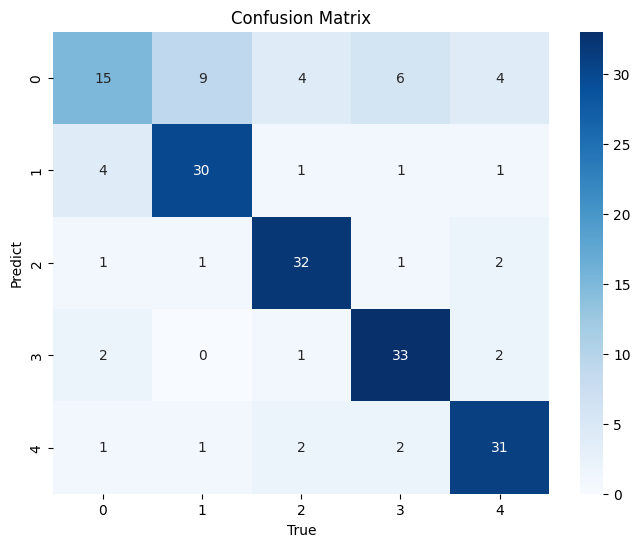

In [55]:
# membuat confusion matrix untuk mengetahui hasil prediksi secara detail

cm = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### Random Forest 

In [56]:
# menginisiasi model RanfomForest dan melakukan pelatihan model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [57]:
# melakukan prediksi data test dan evaluasi terhadap model
y_pred_rf = rf_model.predict(X_test)
# Evaluate the Random Forest model
print("\nRandom Forest Model:")
accuracy_rf_smote = round(accuracy_score(y_test, y_pred_rf),3)
print("Accuracy:",accuracy_rf_smote)
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))


Random Forest Model:
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.89      0.92        38
         1.0       0.85      0.92      0.88        37
         2.0       0.89      0.89      0.89        37
         3.0       0.95      0.97      0.96        38
         4.0       0.97      0.92      0.94        37

    accuracy                           0.92       187
   macro avg       0.92      0.92      0.92       187
weighted avg       0.92      0.92      0.92       187



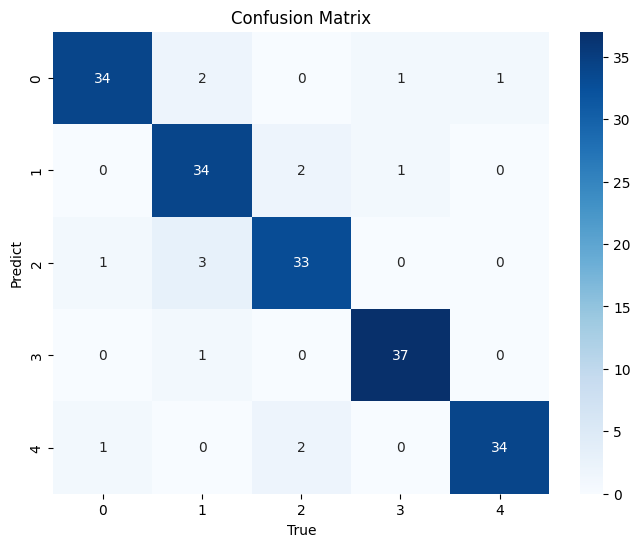

In [55]:
# membuat confusion matrix untuk mengetahui hasil predict secara detail
cm = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### XGBoost

In [56]:
# menginisiasi XGBClassifier dan melakukan pelatihan model
xgb_model = XGBClassifier(learning_rate=0.1, n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [57]:
# melakukan prediksi data test dan evaluasi terhadap model
y_pred_xgb = xgb_model.predict(X_test)
# Evaluate the XGBoost model
print("\nXGBoost Model:")
accuracy_xgb_smote = round(accuracy_score(y_test, y_pred_xgb),3)
print("Accuracy:",accuracy_xgb_smote)
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb))


XGBoost Model:
Accuracy: 0.904
Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.89      0.91        38
         1.0       0.94      0.84      0.89        37
         2.0       0.85      0.89      0.87        37
         3.0       0.88      0.97      0.93        38
         4.0       0.94      0.92      0.93        37

    accuracy                           0.90       187
   macro avg       0.91      0.90      0.90       187
weighted avg       0.91      0.90      0.90       187



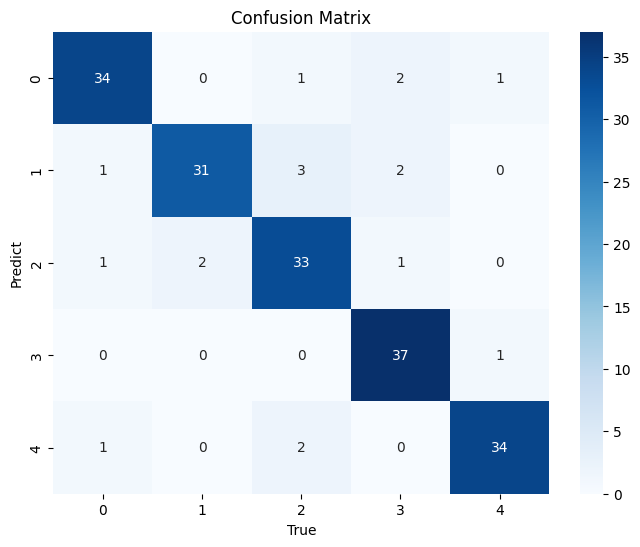

In [58]:
# membuat confusion matrix untuk mengetahui hasil predict secara detail
cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

## Oversampling + Normalisasi

In [ ]:
''' 
Pada bagian ini melakukan pelatihan model menggunakan data yang sudah dinormalisasi dengan menggunakan 3 model machine learning
yaitu KNN, Random Forest, XGBoost.
'''

### KNN

In [59]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(X_train_normal, y_train_normal)

KNeighborsClassifier(n_neighbors=3)

In [60]:
y_pred_knn = knn_model.predict(X_test_normal)
# Evaluate the KNN model
print("K-Nearest Neighbors (KNN) Model:")
accuracy_knn_smote_normal = round(accuracy_score(y_test_normal,y_pred_knn),3)
print("Accuracy:", accuracy_knn_smote_normal)
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_knn))

K-Nearest Neighbors (KNN) Model:
Accuracy: 0.898
Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.71      0.81        38
         1.0       0.80      0.89      0.85        37
         2.0       0.85      0.92      0.88        37
         3.0       0.95      1.00      0.97        38
         4.0       0.97      0.97      0.97        37

    accuracy                           0.90       187
   macro avg       0.90      0.90      0.90       187
weighted avg       0.90      0.90      0.90       187



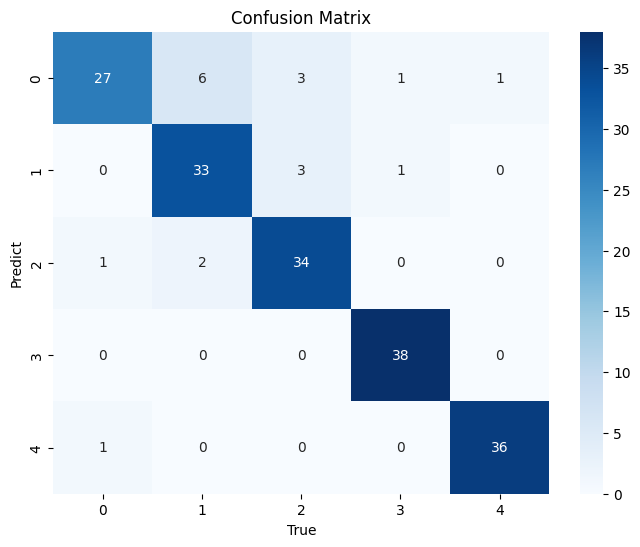

In [61]:
cm = confusion_matrix(y_test_normal, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### Random Forest

In [62]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_normal, y_train_normal)

RandomForestClassifier(random_state=42)

In [63]:
y_pred_rf = rf_model.predict(X_test_normal)
# Evaluate the Random Forest model
print("\nRandom Forest Model:")
accuracy_rf_smote_normal = round(accuracy_score(y_test_normal, y_pred_rf),3)
print("Accuracy:",accuracy_rf_smote_normal )
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_rf))


Random Forest Model:
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.89      0.92        38
         1.0       0.87      0.92      0.89        37
         2.0       0.89      0.89      0.89        37
         3.0       0.93      0.97      0.95        38
         4.0       0.97      0.92      0.94        37

    accuracy                           0.92       187
   macro avg       0.92      0.92      0.92       187
weighted avg       0.92      0.92      0.92       187



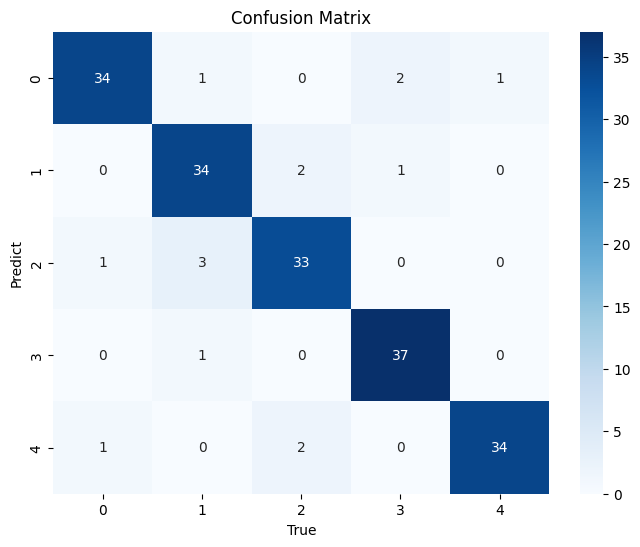

In [64]:
cm = confusion_matrix(y_test_normal, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### XGBoost

In [65]:
xgb_model = XGBClassifier(learning_rate=0.1, n_estimators=100, random_state=42)
xgb_model.fit(X_train_normal, y_train_normal)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [66]:
y_pred_xgb = xgb_model.predict(X_test_normal)
# Evaluate the XGBoost model
print("\nXGBoost Model:")
accuracy_xgb_smote_normal = round(accuracy_score(y_test_normal, y_pred_xgb),3)
print("Accuracy:",accuracy_xgb_smote_normal)
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_xgb))


XGBoost Model:
Accuracy: 0.904
Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.89      0.91        38
         1.0       0.94      0.84      0.89        37
         2.0       0.85      0.89      0.87        37
         3.0       0.88      0.97      0.93        38
         4.0       0.94      0.92      0.93        37

    accuracy                           0.90       187
   macro avg       0.91      0.90      0.90       187
weighted avg       0.91      0.90      0.90       187



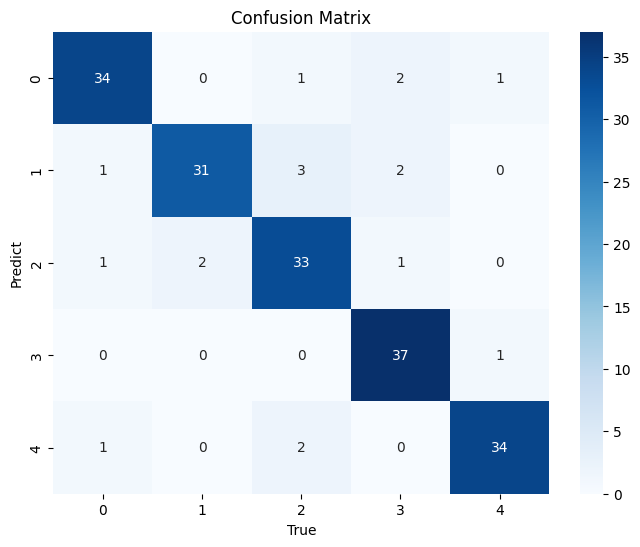

In [67]:
cm = confusion_matrix(y_test_normal, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

## Tunning + Normalization + Oversampling

### KNN

In [68]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV

In [70]:
# Melatih model dengan melakukan tunning menggunakan GridSearchCV
knn_model = KNeighborsClassifier()
param_grid = {
    "n_neighbors": range(3, 21), # jumlah sample terdekat
    "metric": ["euclidean", "manhattan", "chebyshev"], # algoritma perhitungan jarak
    "weights": ["uniform", "distance"], # pembobotan untuk sample terdekat
    "algorithm": ["auto", "ball_tree", "kd_tree"], # algoritma perhitungan tetangga terdekat
    "leaf_size": range(10, 61), # ukuran daun untul algoritma ball_tree dan kd_tree
}
knn_model = GridSearchCV(estimator=knn_model, param_grid=param_grid, scoring="accuracy", cv=5, verbose = 4)
knn_model.fit(X_train_normal, y_train_normal)
best_params = knn_model.best_params_
print(f"Best parameters: {best_params}")

Fitting 5 folds for each of 16524 candidates, totalling 82620 fits
[CV 1/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=uniform;, score=0.833 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=uniform;, score=0.880 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=uniform;, score=0.847 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=uniform;, score=0.899 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=uniform;, score=0.832 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance;, score=0.853 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance;, score=0.900 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=10, metric=euclid

In [71]:
y_pred_knn = knn_model.predict(X_test_normal)
# Evaluate the KNN model
print("K-Nearest Neighbors (KNN) Model:")
accuracy_knn_smote_normal_Tun = round(accuracy_score(y_test_normal,y_pred_knn),3)
print("Accuracy:", accuracy_knn_smote_normal_Tun)
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_knn))

K-Nearest Neighbors (KNN) Model:
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.74      0.85        38
         1.0       0.83      0.92      0.87        37
         2.0       0.88      0.95      0.91        37
         3.0       0.95      1.00      0.97        38
         4.0       0.97      1.00      0.99        37

    accuracy                           0.92       187
   macro avg       0.93      0.92      0.92       187
weighted avg       0.93      0.92      0.92       187



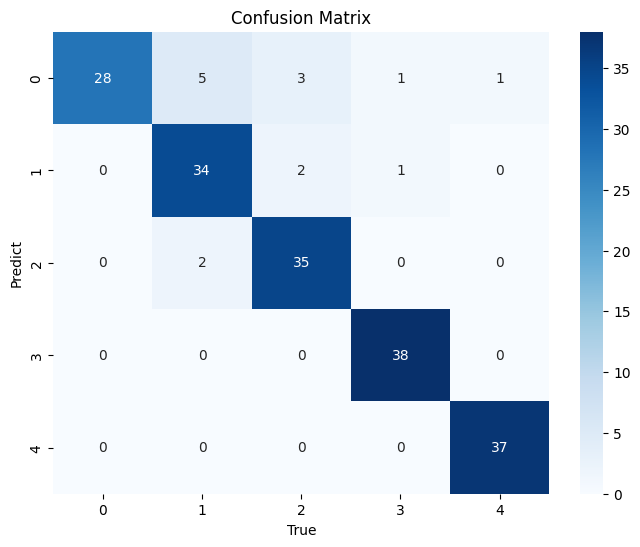

In [72]:
cm = confusion_matrix(y_test_normal, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### Random Forest

In [73]:
# mengoptimasi model random forest dengan tunning menggunakan gridsearch
# Import library yang dibutuhkan
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Membuat objek RandomForestClassifier
rf_model = RandomForestClassifier()

# Menentukan himpunan parameter untuk dicoba
param_grid = {
    "n_estimators": [100, 200],         # Jumlah pohon keputusan dalam ensemble
    "max_depth": [10, 15],              # Maksimal kedalaman setiap pohon
    "min_samples_leaf": [1, 2],          # Jumlah sampel minimum yang diperlukan untuk menjadi daun di pohon
    "min_samples_split": [2, 5],             # Jumlah sampel minimum yang diperlukan untuk membagi simpul internal
    "max_features": ["sqrt", "log2"],        # Jumlah fitur yang dipertimbangkan saat mencari split terbaik
}

# Membuat objek GridSearchCV
rf_model = GridSearchCV(rf_model, param_grid=param_grid, cv=5, n_jobs=-1)

# Melakukan pelatihan model dengan data yang telah dinormalisasi
rf_model.fit(X_train_normal, y_train_normal)

# Mendapatkan parameter terbaik
best_params = rf_model.best_params_

# Menampilkan parameter terbaik
print(f"Best parameters: {best_params}")


Best parameters: {'max_depth': 15, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [74]:
y_pred_rf = rf_model.predict(X_test_normal)
# Evaluate the Random Forest model
print("\nRandom Forest Model:")
accuracy_rf_smote_normal_Tun = round(accuracy_score(y_test_normal, y_pred_rf),3)
print("Accuracy:",accuracy_rf_smote_normal_Tun)
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_rf))


Random Forest Model:
Accuracy: 0.893
Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.89      0.92        38
         1.0       0.84      0.86      0.85        37
         2.0       0.82      0.86      0.84        37
         3.0       0.90      0.95      0.92        38
         4.0       0.97      0.89      0.93        37

    accuracy                           0.89       187
   macro avg       0.90      0.89      0.89       187
weighted avg       0.90      0.89      0.89       187



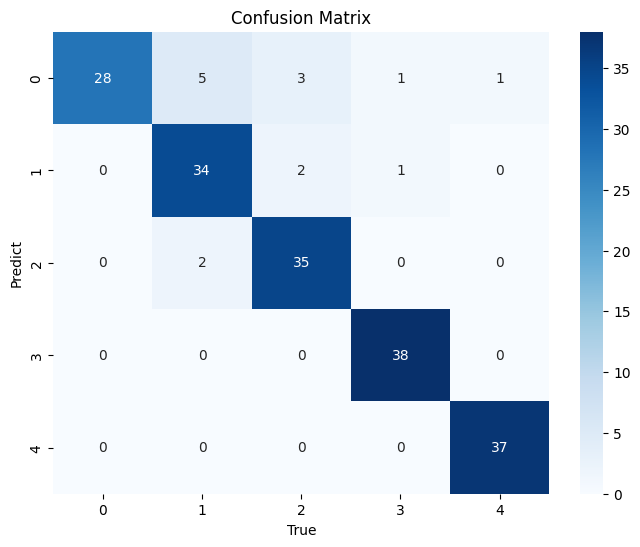

In [75]:
cm = confusion_matrix(y_test_normal, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

### XGBoost

In [76]:
# Import library yang dibutuhkan
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Membuat objek XGBClassifier
xgb_model = XGBClassifier()

# Menentukan himpunan parameter untuk dicoba
param_grid = {
    "max_depth": [3, 5, 7],                  # Maksimal kedalaman setiap pohon
    "learning_rate": [0.01, 0.1],            # Tingkat pembelajaran (learning rate)
    "n_estimators": [100, 200],              # Jumlah pohon keputusan
    "gamma": [0, 0.1],                       # Parameter regulasi gamma
    "colsample_bytree": [0.7, 0.8],         # Fraksi fitur yang diperbolehkan pada setiap pohon
}

# Membuat objek GridSearchCV
xgb_model = GridSearchCV(xgb_model, param_grid=param_grid, cv=5, n_jobs=-1)

# Melakukan pelatihan model dengan data yang telah dinormalisasi
xgb_model.fit(X_train_normal, y_train_normal)

# Mendapatkan parameter terbaik
best_params = xgb_model.best_params_

# Menampilkan parameter terbaik
print(f"Best parameters: {best_params}")


Best parameters: {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}


In [77]:
y_pred_xgb = xgb_model.predict(X_test_normal)
# Evaluate the XGBoost model
print("\nXGBoost Model:")
accuracy_xgb_smote_normal_Tun = round(accuracy_score(y_test_normal, y_pred_xgb),3)
print("Accuracy:",accuracy_xgb_smote_normal_Tun)
print("Classification Report:")
print(classification_report(y_test_normal, y_pred_xgb))


XGBoost Model:
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.95      0.92        38
         1.0       0.89      0.84      0.86        37
         2.0       0.89      0.86      0.88        37
         3.0       0.95      1.00      0.97        38
         4.0       0.97      0.95      0.96        37

    accuracy                           0.92       187
   macro avg       0.92      0.92      0.92       187
weighted avg       0.92      0.92      0.92       187



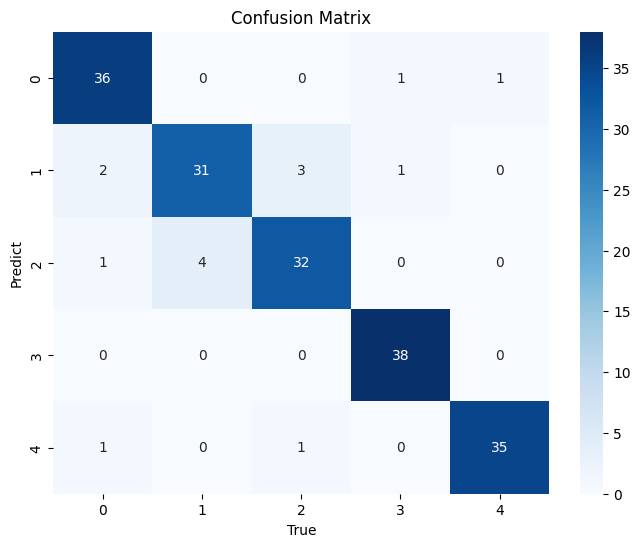

In [78]:
cm = confusion_matrix(y_test_normal, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('True')
plt.ylabel('Predict')
plt.show()

# Evaluasi

## SMOTE

In [79]:
# membuat datafram berisi nama algoritma dan akurasi yang dihasilkan
import matplotlib.pyplot as plt

model_comp1 = pd.DataFrame({'Model': ['K-Nearest Neighbour','Random Forest',
'XGBoost'], 'Accuracy': [accuracy_knn_smote*100,
accuracy_rf_smote*100,accuracy_xgb_smote*100]})

model_comp1.head()

,Model,Accuracy
0,K-Nearest Neighbour,75.4
1,Random Forest,92.0
2,XGBoost,90.4


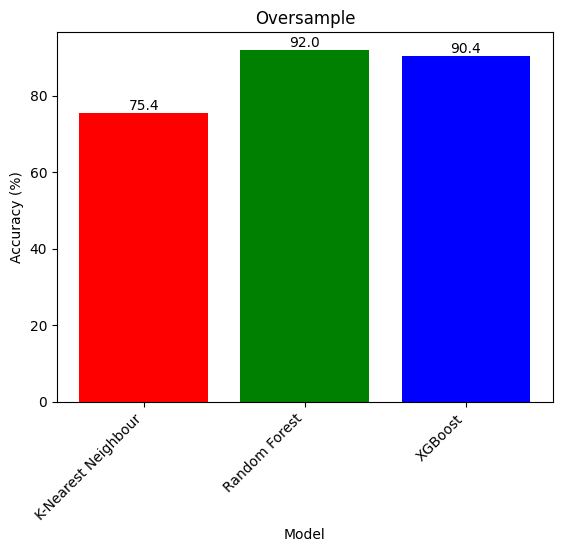

In [80]:
# Membuat bar plot dengan keterangan jumlah
fig, ax = plt.subplots()
bars = plt.bar(model_comp1['Model'], model_comp1['Accuracy'], color=['red', 'green', 'blue'])
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('Oversample')
plt.xticks(rotation=45, ha='right') # Untuk memutar label sumbu x agar lebih mudah dibaca
# Menambahkan keterangan jumlah di atas setiap bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
plt.show()

## SMOTE + Norm

In [81]:
# membuat dataframe dengan kolom nama model dan akurasi yang dihasilkan
model_comp2 = pd.DataFrame({'Model': ['K-Nearest Neighbour','Random Forest',
'XGBoost'], 'Accuracy': [accuracy_knn_smote_normal*100,
accuracy_rf_smote_normal*100,accuracy_xgb_smote_normal*100]})

model_comp2.head()

,Model,Accuracy
0,K-Nearest Neighbour,89.8
1,Random Forest,92.0
2,XGBoost,90.4


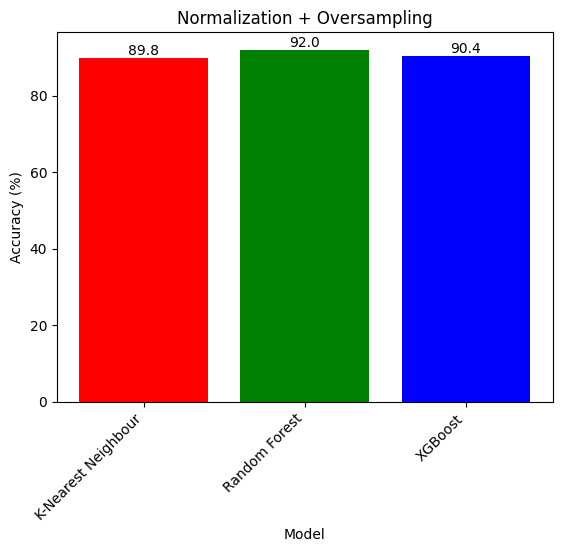

In [82]:
# Membuat bar plot dengan keterangan jumlah
fig, ax = plt.subplots()
bars = plt.bar(model_comp2['Model'], model_comp2['Accuracy'], color=['red', 'green', 'blue'])
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('Normalization + Oversampling')
plt.xticks(rotation=45, ha='right') # Untuk memutar label sumbu x agar lebih mudah dibaca
# Menambahkan keterangan jumlah di atas setiap bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
plt.show()

## SMOTE + NORM + Tunning

In [83]:
# membuat datafram dengan kolom model dan akurasi yang dihasilkan
model_comp3 = pd.DataFrame({'Model': ['K-Nearest Neighbour','Random Forest',
'XGBoost'], 'Accuracy': [accuracy_knn_smote_normal_Tun*100,
accuracy_rf_smote_normal_Tun*100,accuracy_xgb_smote_normal_Tun*100]})

model_comp3.head()

,Model,Accuracy
0,K-Nearest Neighbour,92.0
1,Random Forest,89.3
2,XGBoost,92.0


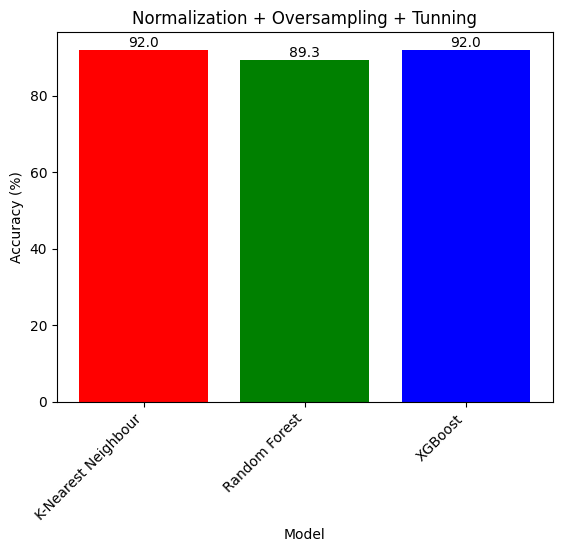

In [84]:
# Membuat bar plot dengan keterangan jumlah
fig, ax = plt.subplots()
bars = plt.bar(model_comp3['Model'], model_comp3['Accuracy'], color=['red', 'green', 'blue'])
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('Normalization + Oversampling + Tunning')
plt.xticks(rotation=45, ha='right') # Untuk memutar label sumbu x agar lebih mudah dibaca
# Menambahkan keterangan jumlah di atas setiap bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
plt.show()

In [85]:
# membuat dataframe dengan kolom model dan akuarsi (menggunakan model dengan akurasi terbaik)
model_compBest = pd.DataFrame({
'Model': ['K-Nearest Neighbour OverSample Tunning', 'Random Forest OverSample',
'XGB OverSample Standarization Tunning'],
'Accuracy': [accuracy_knn_smote_normal_Tun*100, accuracy_rf_smote_normal*100,
accuracy_xgb_smote_normal_Tun*100]
})

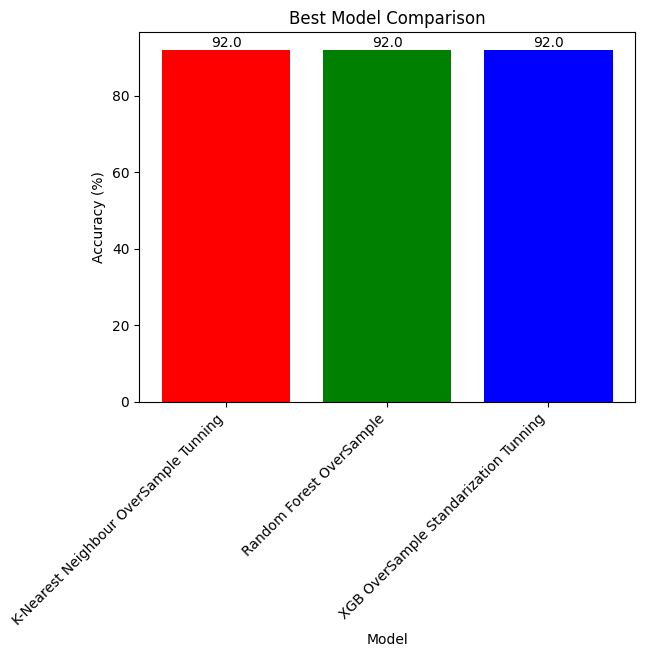

In [86]:
# Membuat bar plot dengan keterangan jumlah
fig, ax = plt.subplots()
bars = plt.bar(model_compBest['Model'], model_compBest['Accuracy'], color=['red', 'green', 'blue'])
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('Best Model Comparison')
plt.xticks(rotation=45, ha='right') # Untuk memutar label sumbu x agar lebih mudah dibaca
# Menambahkan keterangan jumlah di atas setiap bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
plt.show()

In [98]:
# menyimpan model kedalam bentuk pickle
import pickle

# Nama file untuk menyimpan model
file_name = "model/rf_model.pkl"

# Menyimpan model ke dalam file pickle
with open(file_name, 'wb') as file:
    pickle.dump(rf_model, file)

# Streamlit


# Kesimpulan

In [ ]:
# Pembahasan dan Kesimpulan
''' 
Dari percobaan diatas dapat disimpulkan bahwa rata-rata akurasi model machine learning untuk dataset heart disease adalah 92%.
Untuk algoritma KNN akurasi tertinggi di angka 92% dengan menggunakan data yang telah di SMOTE, Normalisasi dan di lakukan tunning terhadap modelnya,
sedangkan akurasi terendah di angka 75% dengan menggunakan data yang telah di SMOTE, tanpa normalisasi dan tunning pada model.

Untuk algoritma Random Forest akurasi tertinggi diangka 92% dengan menggunakan data SMOTE tanpa norm & tunning dan pada data SMOTE Norm tanpa tunning,
sedangkan akurasi pada model yang telah ditunning mengalami penurunan di angka 89%. hal ini menandakan proses tunning yang dilakukan kurang optimal.

Untuk algoritma XGBoost pada 2 percobaan pertama mendapatkan akurasi 90%. sedangkan pada percobaan ketiga mendapatkan akurasi 92%. 

Secara keseluruhan penggunaan SMOTE untuk menangani imbalance data bisa dikatakan efektif dan proses tunning menggunakan grid search
dapat meningkatkan akurasi model.
'''